<a href="https://colab.research.google.com/github/johnreyes96/artificial-vision/blob/master/src/main/python/AllFiltersAndNoises.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Ruido sal y pimienta

Text(0.5, 1.0, 'Ruido sal y pimienta')

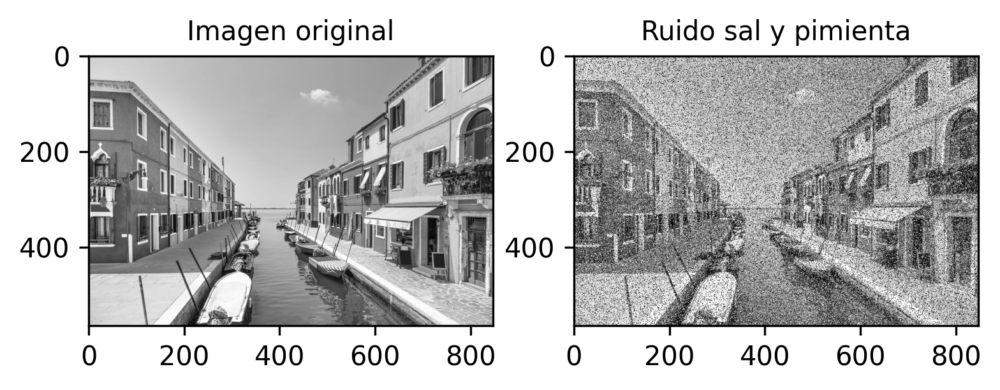

In [ ]:
import cv2
import numpy as np
from skimage.util import random_noise
from google.colab.patches import cv2_imshow

# Load image
img = cv2.imread("/content/drive/MyDrive/vision_artificial/images/HCColor2.jpg",cv2.IMREAD_GRAYSCALE) # gray scale

noise_img = random_noise(img, mode='s&p',amount=0.3)
noise_img = np.array(255*noise_img, dtype = 'uint8')

# Display images
fig=plt.figure(dpi=300)

fig.add_subplot(1,2,1)
plt.imshow(img, cmap="gray")
plt.title("Imagen original", fontsize = 10)

fig.add_subplot(1,2,2)                         
plt.imshow(noise_img, cmap="gray")
plt.title("Ruido sal y pimienta", fontsize = 10)

# Ruido uniforme

Text(0.5, 1.0, 'Ruido uniformeo')

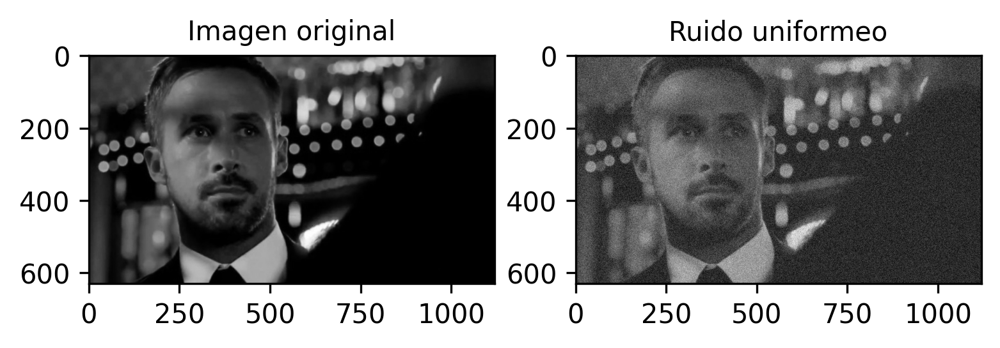

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
imagenEnt = cv2.imread('/content/drive/MyDrive/vision_artificial/images/HCColor1.jpg',cv2.IMREAD_GRAYSCALE) # gray scale
nf,nc = imagenEnt.shape 
imagenEnt = imagenEnt.astype(np.float64)

uni_noise=np.zeros((nf,nc),dtype=np.float64)
cv2.randu(uni_noise,0,255)
uni_noise=(uni_noise*0.5).astype(np.float64)
un_img=cv2.add(imagenEnt, uni_noise)

# Display images
fig=plt.figure(dpi=300)

fig.add_subplot(1,2,1)
plt.imshow(imagenEnt, cmap="gray")
plt.title("Imagen original", fontsize = 10)

fig.add_subplot(1,2,2)                         
plt.imshow(un_img, cmap="gray")
plt.title("Ruido uniformeo", fontsize = 10)

# Ruido gaussiano

Text(0.5, 1.0, 'Imagen + ruido gaussiano')

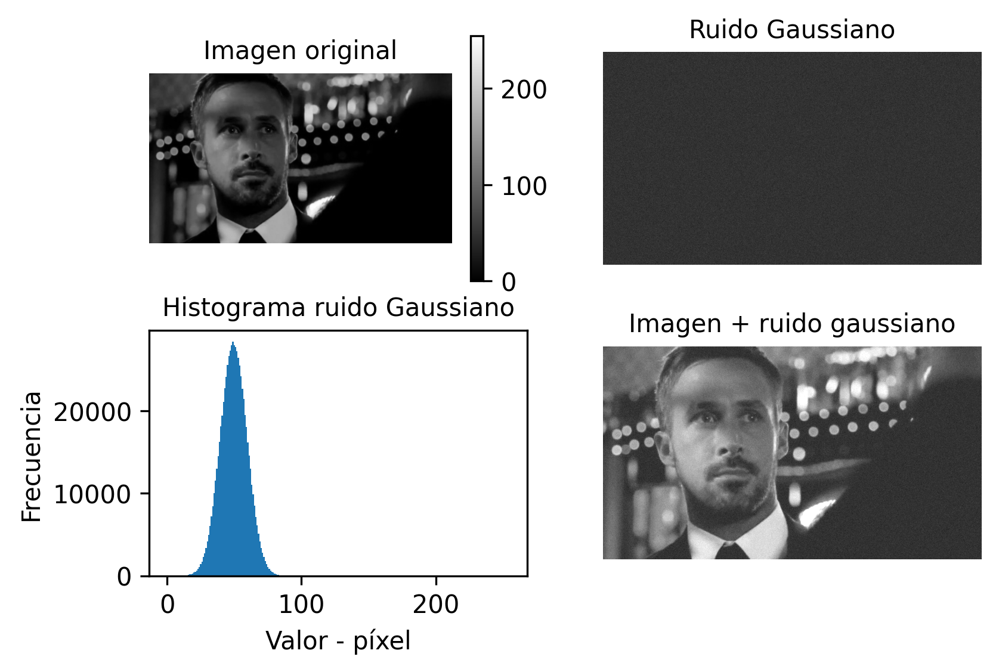

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Original image
imagenEnt = cv2.imread('/content/drive/MyDrive/vision_artificial/images/HCColor1.jpg',cv2.IMREAD_GRAYSCALE) # gray scale
nf,nc = imagenEnt.shape 
imagenEnt = imagenEnt.astype(np.float64)

# Gaussian noise
gauss_noise=np.zeros((nf,nc),dtype=np.float64)
cv2.randn(gauss_noise,50,10)                
gauss_noise.astype(np.float64)
imagenRuido = cv2.add(imagenEnt,gauss_noise)
gauss_noiseHist = gauss_noise
gauss_noiseHist = gauss_noiseHist.astype(np.uint8)

# Histrogram
def fnHistograma(inputIm):
 vHistograma = np.zeros((1,256))
 pixelRange = range(0,255)
 valsPixel = np.arange(256)

 for pixelValue in pixelRange:
  vHistograma[0,pixelValue] = (inputIm == pixelValue).sum()

 vHistograma = list(vHistograma.flatten())
 return vHistograma,valsPixel

histRuido,vecPixels = fnHistograma(gauss_noiseHist)

# Image + Gaussian noise
imagenRuido = cv2.add(imagenEnt,gauss_noise)

# Display images
fig=plt.figure(dpi=300)

fig.add_subplot(2,2,1)
plt.imshow(imagenEnt, cmap="gray", vmin=0, vmax=255)
plt.axis("off")
plt.title("Imagen original", fontsize = 10)
plt.colorbar()

fig.add_subplot(2,2,2)                         
plt.imshow(gauss_noise,cmap='gray', vmin=0, vmax=255)
plt.axis("off")
plt.title("Ruido Gaussiano", fontsize = 10)

fig.add_subplot(2,2,3)
plt.bar(vecPixels,histRuido, align='center',width = 1)
plt.xlabel("Valor - píxel", fontsize = 10)
plt.ylabel("Frecuencia", fontsize = 10)
plt.title("Histograma ruido Gaussiano", fontsize = 10)

fig.add_subplot(2,2,4)
plt.imshow(imagenRuido,cmap='gray', vmin=0, vmax=255)
plt.axis("off")
plt.title("Imagen + ruido gaussiano", fontsize = 10)

# Procesamiento con filtro promedio

Text(0.5, 1.0, 'Con procesamiento de filtro promedio')

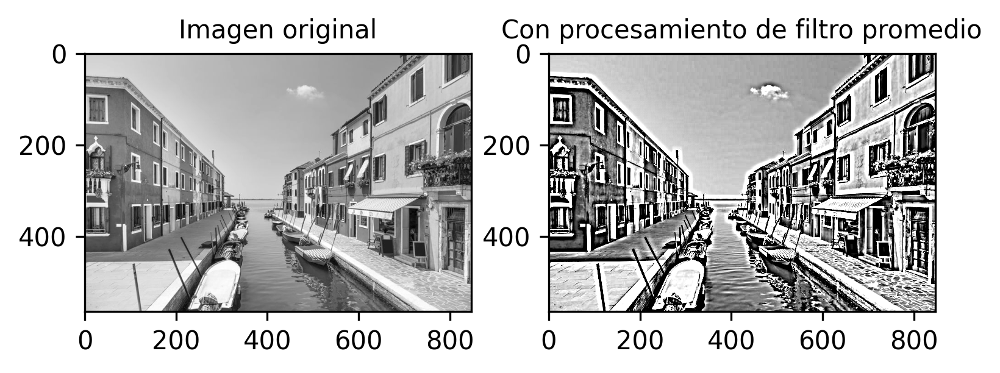

In [ ]:
import cv2
import numpy as np
from scipy import signal
from google.colab.patches import cv2_imshow

# Load image
imagenEnt = cv2.imread('/content/drive/MyDrive/vision_artificial/images/HCColor2.jpg',cv2.IMREAD_GRAYSCALE) # gray scale
nf,nc = imagenEnt.shape 
Fx = imagenEnt.astype(np.float64)

kSize = 21
k = 5
kernel = (1/(kSize*kSize))*np.ones([kSize,kSize])
fSmooth = signal.convolve2d(Fx,kernel, boundary='symm', mode='same')
Gx = Fx - fSmooth
fSharp = Fx + (k*Gx)
fSharp.astype(np.uint8)

# Display images
fig=plt.figure(dpi=300)

fig.add_subplot(1,2,1)
plt.imshow(Fx, cmap="gray", vmin=0, vmax=255)
plt.title("Imagen original", fontsize = 10)

fig.add_subplot(1,2,2)                         
plt.imshow(fSharp, cmap="gray", vmin=0, vmax=255)
plt.title("Con procesamiento de filtro promedio", fontsize = 10)

# Filtro promedio

Text(0.5, 1.0, 'Con procesamiento de filtro promedio')

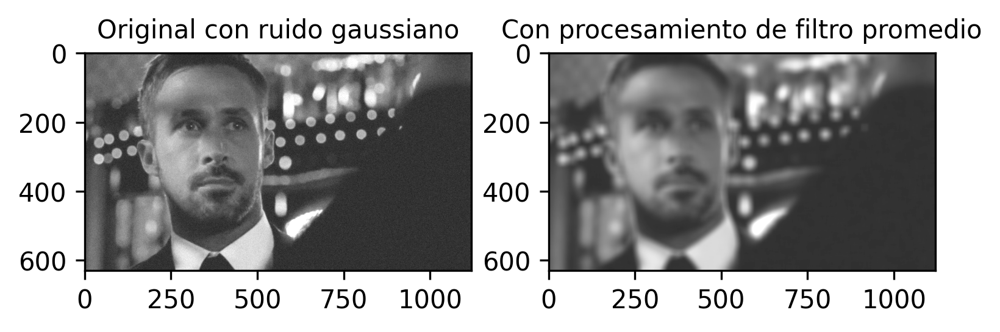

In [ ]:
import cv2
import numpy as np
from scipy import signal
from google.colab.patches import cv2_imshow

# Load image
imagenEnt = cv2.imread('/content/drive/MyDrive/vision_artificial/images/HCColor1.jpg',cv2.IMREAD_GRAYSCALE) # gray scale
nf,nc = imagenEnt.shape 
imagenEnt = imagenEnt.astype(np.float64)

gauss_noise=np.zeros((nf,nc),dtype=np.float64)
cv2.randn(gauss_noise,50,10)
gauss_noise.astype(np.float64)
kSize = 21
kernel = (1 / (kSize*kSize)) * np.ones([kSize, kSize])
imagenRuido = cv2.add(imagenEnt,gauss_noise)
lpf_promedio = signal.convolve2d(imagenRuido, kernel, boundary='symm', mode='same')

# Display images
fig=plt.figure(dpi=300)

fig.add_subplot(1,2,1)
plt.imshow(imagenRuido, cmap="gray", vmin=0, vmax=255)
plt.title("Original con ruido gaussiano", fontsize = 10)

fig.add_subplot(1,2,2)                         
plt.imshow(lpf_promedio, cmap="gray", vmin=0, vmax=255)
plt.title("Con procesamiento de filtro promedio", fontsize = 10)

# Filtro de mediana

Text(0.5, 1.0, 'Mediana')

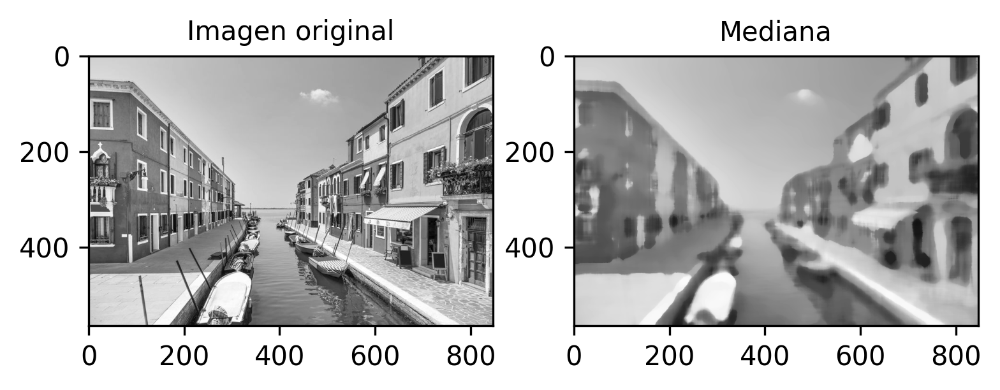

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.util import random_noise

# Load image
img = cv2.imread("/content/drive/MyDrive/vision_artificial/images/HCColor2.jpg",cv2.IMREAD_GRAYSCALE) # gray scale

kSize = 21
noise_img = random_noise(img, mode='s&p',amount=0.3)
noise_img = np.array(255*noise_img, dtype = 'uint8')
lpf_mediana = cv2.medianBlur(noise_img, kSize)

# Display images
fig=plt.figure(dpi=300)

fig.add_subplot(1,2,1)
plt.imshow(img, cmap="gray", vmin=0, vmax=255)
plt.title("Imagen original", fontsize = 10)

fig.add_subplot(1,2,2)                         
plt.imshow(lpf_mediana, cmap="gray", vmin=0, vmax=255)
plt.title("Mediana", fontsize = 10)

# Filtro Gaussiano

Text(0.5, 1.0, 'Con procesamiento de filtro gaussiano')

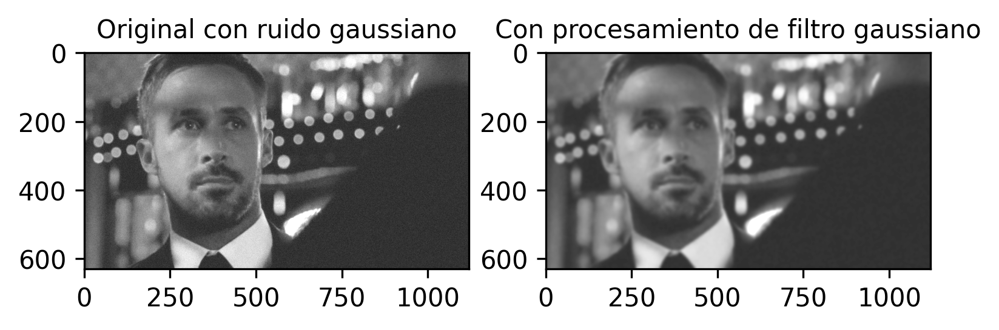

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load image
imagenEnt = cv2.imread('/content/drive/MyDrive/vision_artificial/images/HCColor1.jpg',cv2.IMREAD_GRAYSCALE) # gray scale
nf,nc = imagenEnt.shape 
imagenEnt = imagenEnt.astype(np.float64)

gauss_noise=np.zeros((nf,nc),dtype=np.float64)
cv2.randn(gauss_noise,50,10)
gauss_noise.astype(np.float64)
imagenRuido = cv2.add(imagenEnt,gauss_noise)
kSize = 21
lpf_gaussiano = cv2.GaussianBlur(imagenRuido, (kSize, kSize), 0)

# Display images
fig=plt.figure(dpi=300)

fig.add_subplot(1,2,1)
plt.imshow(imagenRuido, cmap="gray", vmin=0, vmax=255)
plt.title("Original con ruido gaussiano", fontsize = 10)

fig.add_subplot(1,2,2)                         
plt.imshow(lpf_gaussiano, cmap="gray", vmin=0, vmax=255)
plt.title("Con procesamiento de filtro gaussiano", fontsize = 10)

# Filtro pasa bajos de tamaño variable y filtro promedio

Text(0.5, 1.0, 'Filtro pasa bajos y filtro promedio')

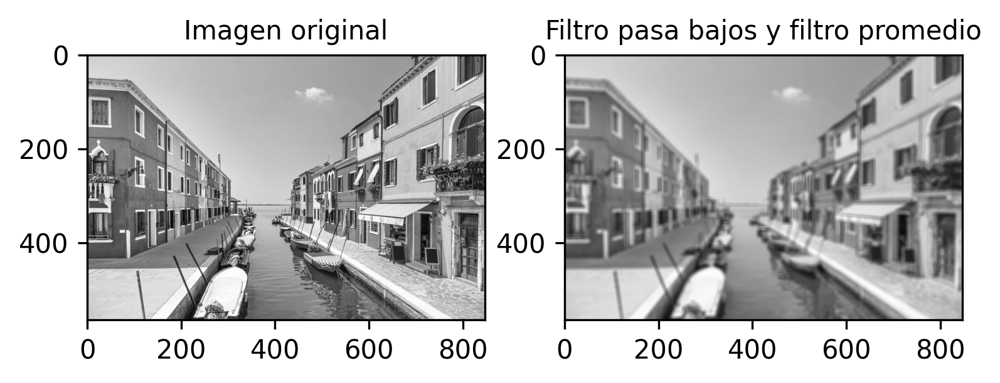

In [ ]:
import cv2
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt

# Load image
imagenEntrada = cv2.imread('/content/drive/MyDrive/vision_artificial/images/HCColor2.jpg',cv2.IMREAD_GRAYSCALE) # gray scale

n = 9
kernel= (1/(n*n))*np.ones([n,n])
filtIm=signal.convolve2d(imagenEntrada, kernel, boundary='symm', mode='same')

# Display images
fig=plt.figure(dpi=300)

fig.add_subplot(1,2,1)
plt.imshow(imagenEntrada, cmap="gray", vmin=0, vmax=255)
plt.title("Imagen original", fontsize = 10)

fig.add_subplot(1,2,2)                         
plt.imshow(filtIm, cmap="gray", vmin=0, vmax=255)
plt.title("Filtro pasa bajos y filtro promedio", fontsize = 10)

# Saturación

Text(0.5, 1.0, 'Imagen con saturación')

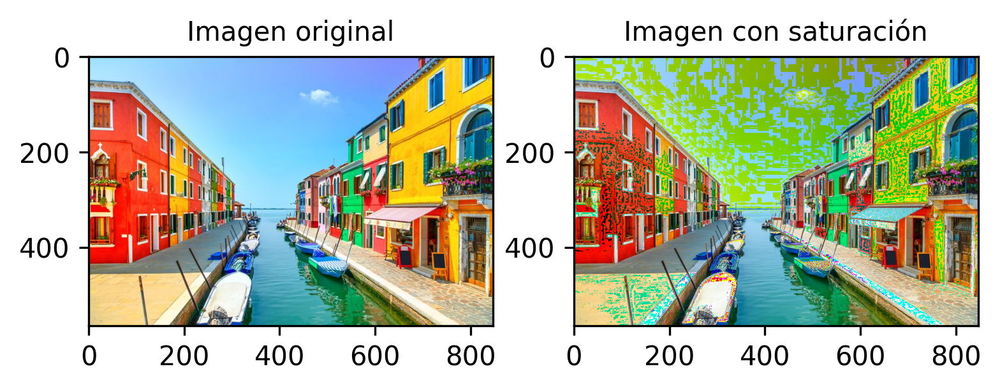

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
imagenEntrada = cv2.imread('/content/drive/MyDrive/vision_artificial/images/HCColor2.jpg',cv2.IMREAD_COLOR) # color scale
imagenEntrada = cv2.cvtColor(imagenEntrada, cv2.COLOR_BGR2RGB)

# Contrast method
def fnHistoContrastEnhance(inputIm,outMin,outMax):
 outIm = 0 * inputIm
 inMin = np.min(inputIm)
 inMax = np.max(inputIm)

 m = (outMax - outMin) / (inMax - inMin)
 pixelInputVal = range(inMin, inMax)
 for pixelValue in pixelInputVal:
   outIm[inputIm == pixelValue] = (m * (pixelValue - inMin)) + outMin
   
 return outIm

imContrastEnhanced = fnHistoContrastEnhance(imagenEntrada,0,255)

# Display images
fig=plt.figure(dpi=300)

fig.add_subplot(1,2,1)
plt.imshow(imagenEntrada, cmap="gray", vmin=0, vmax=255)
plt.title("Imagen original", fontsize = 10)

fig.add_subplot(1,2,2)                         
plt.imshow(imContrastEnhanced, cmap="gray", vmin=0, vmax=255)
plt.title("Imagen con saturación", fontsize = 10)

# Contraste

Text(0.5, 1.0, 'Imagen con contraste')

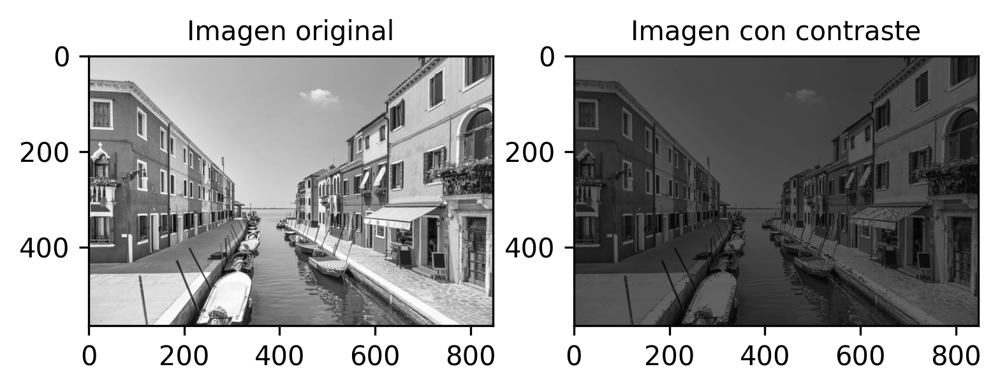

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
imagenEntrada = cv2.imread('/content/drive/MyDrive/vision_artificial/images/HCColor2.jpg',cv2.IMREAD_GRAYSCALE) # gray scale

# Contrast method
def fnHistoContrastEnhance(inputIm,outMin,outMax,inc):
 
 outIm = 0 * inputIm
 inMin = np.min(inputIm)
 inMax = np.max(inputIm)
 pixelInputVal = range(inMin, inMax)

 if inc == True:
  for pixelValue in pixelInputVal:
    outIm[inputIm == pixelValue] = ((outMax - outMin) / (inMax - inMin)) * (pixelValue - inMin) + outMin
 else:
  for pixelValue in pixelInputVal:
    outIm[inputIm == pixelValue] = ((pixelValue - inMin) / (inMax - inMin)) * (outMax - outMin) + outMin
   
 return outIm

imContrastEnhanced = fnHistoContrastEnhance(imagenEntrada,0,100,True)

# Display images
fig=plt.figure(dpi=300)

fig.add_subplot(1,2,1)
plt.imshow(imagenEntrada, cmap="gray", vmin=0, vmax=255)
plt.title("Imagen original", fontsize = 10)

fig.add_subplot(1,2,2)                         
plt.imshow(imContrastEnhanced, cmap="gray", vmin=0, vmax=255)
plt.title("Imagen con contraste", fontsize = 10)

# Métrica de contraste
Evalúa numéricamente el contraste de imágenes etiquetadas como de alto o bajo contraste

In [ ]:
import cv2
import numpy as np

# Load image
imagenEntrada = cv2.imread('/content/drive/MyDrive/vision_artificial/images/HCColor2.jpg',cv2.IMREAD_GRAYSCALE) # gray scale

# Contrast method
def fnContrast(inputIm, contrastType):
  lMin = np.min(inputIm)
  lMax = np.max(inputIm)

  if "Luminance" == contrastType: # Relación entre la luminancia de un área de interés más brillante y la de un área adyacente más oscura
    contrastF = (lMax - lMin) / (lMin + 1)
  elif "Simple" == contrastType:
    contrastF = lMax / (lMin + 1)
  elif "Michelson" == contrastType:             # Relación entre la dispersión y la suma de las dos luminancias. Esta definición se usa típicamente en la teoría del
    contrastF = (lMax - lMin) / (lMax + lMin)   # procesamiento de señales para determinar la calidad de una señal en relación con su nivel de ruido
  else:
    print("Nombre inválido para métrica de contraste.")
  
  return contrastF

contrastFeat = fnContrast(imagenEntrada, "Michelson")
print(contrastFeat)

1.0


# Gradiante con convolusión 2D con filtro pasa altos

Text(0.5, 1.0, 'Convolusión 2D con filtro pasa altos')

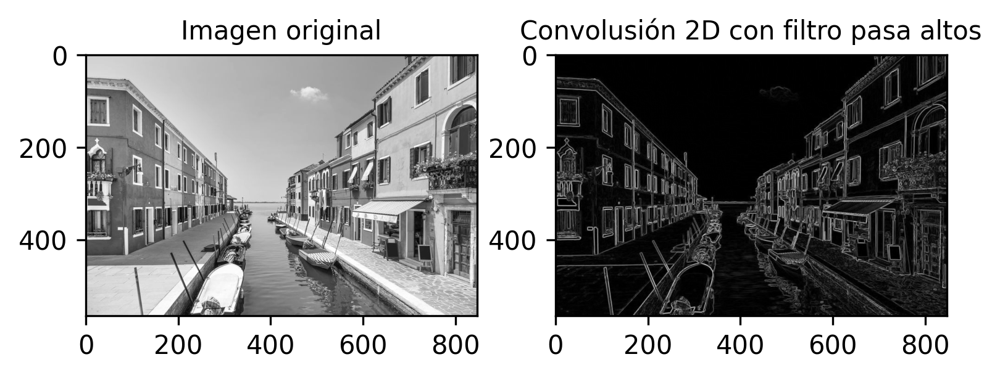

In [ ]:
import cv2
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt

# Load image
imagenEntrada = cv2.imread('/content/drive/MyDrive/vision_artificial/images/HCColor2.jpg',cv2.IMREAD_GRAYSCALE) # gray scale

# high pass Filter
Hx = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])
Hy = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])
# Convolution 2D
Gx = signal.convolve2d(imagenEntrada, Hx, boundary='symm', mode='same')
Gy = signal.convolve2d(imagenEntrada, Hy, boundary='symm', mode='same')
MG = np.sqrt((Gx**2) + (Gy**2))

# Display images
fig=plt.figure(dpi=300)

fig.add_subplot(1,2,1)
plt.imshow(imagenEntrada, cmap="gray")
plt.title("Imagen original", fontsize = 10)

fig.add_subplot(1,2,2)                         
plt.imshow(MG, cmap="gray")
plt.title("Convolusión 2D con filtro pasa altos", fontsize = 10)

# Aplicación unsharp masking

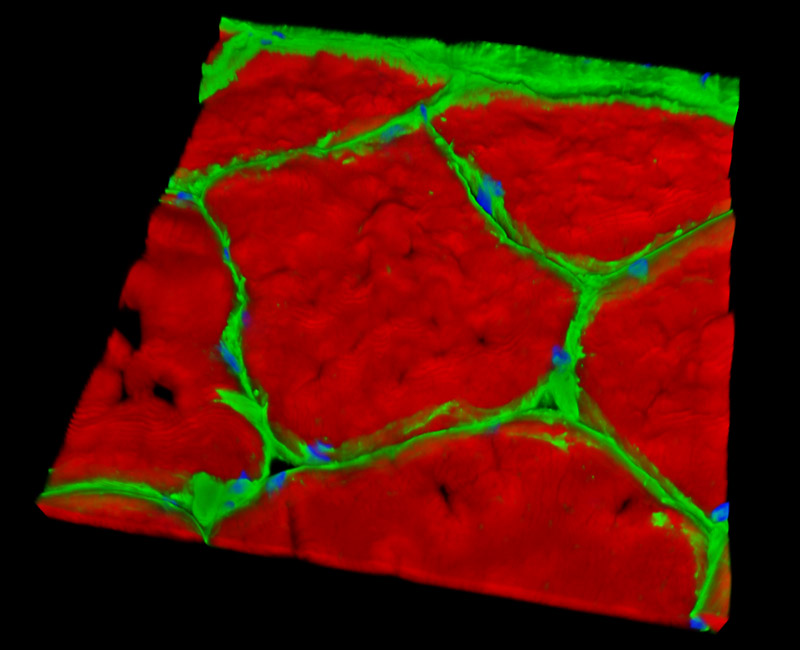

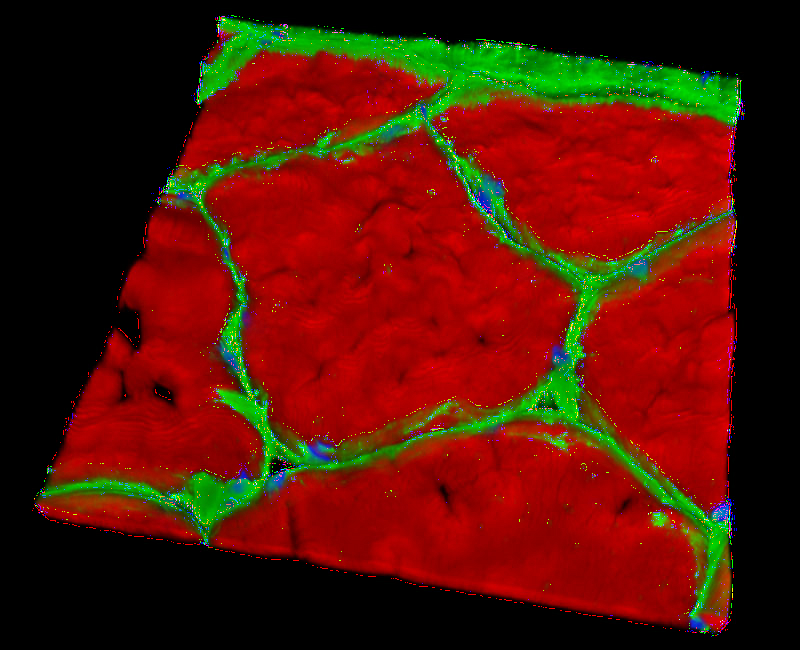

In [ ]:
import cv2
import numpy as np
from scipy import signal
from google.colab.patches import cv2_imshow


def fnUnsharpMasking(R, k, kSize):
  kernel = (1/(kSize*kSize))*np.ones([kSize,kSize])
  fSmooth = signal.convolve2d(R,kernel, boundary='symm', mode='same')
  Gx = R - fSmooth
  fSharp = R + (k*Gx)
  fSharp.astype(np.uint8)
  return fSharp


# Load image
imagenEntrada = cv2.imread('/content/drive/MyDrive/vision_artificial/images/ratsmoothmuscle2.jpg',cv2.IMREAD_COLOR) # color scale
# imagenEntrada = cv2.cvtColor(imagenEntrada, cv2.COLOR_BGR2RGB)

R = imagenEntrada[:,:,0]
G = imagenEntrada[:,:,1]
B = imagenEntrada[:,:,2]
k = 0.5
filterSize = 3
R_UM = fnUnsharpMasking(R, k, filterSize)
G_UM = fnUnsharpMasking(G, k, filterSize)
B_UM = fnUnsharpMasking(B, k, filterSize)
rgb_UM = (np.dstack((R_UM, G_UM, B_UM))).astype(np.uint8)

# Display imageS
cv2_imshow(imagenEntrada)
cv2_imshow(rgb_UM)

# Histograma para imagen en escala de grises

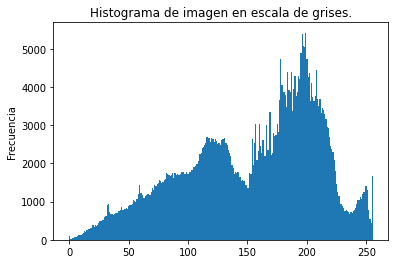

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
imagenEntrada = cv2.imread('/content/drive/MyDrive/vision_artificial/images/HCColor2.jpg',cv2.IMREAD_GRAYSCALE) # gray scale

# Histogram method
def fnHistograma(inputIm):
 vHistograma = np.zeros((1,256))
 pixelRange = range(0,256)
 
 for pixelValue in pixelRange:
  vHistograma[0,pixelValue] = (inputIm == pixelValue).sum()

 return vHistograma

histogramaEG = fnHistograma(imagenEntrada)
histogramaEG = list(histogramaEG.flatten())
valsPixel = np.arange(256)

# Display diagram
plt.bar(valsPixel,histogramaEG, align='center',width = 1)
plt.ylabel('Valor - píxel')
plt.ylabel('Frecuencia')
plt.title('Histograma de imagen en escala de grises')
plt.show()

# Histograma para imagen en escala de colores

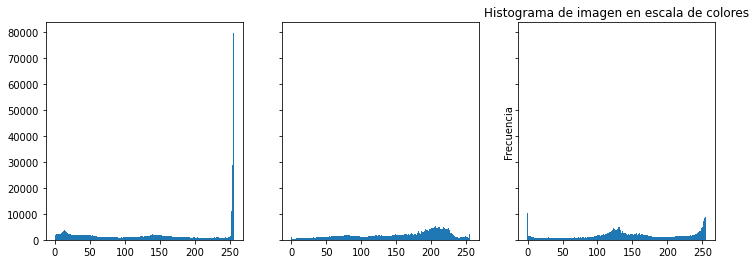

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
imagenEntrada = cv2.imread('/content/drive/MyDrive/vision_artificial/images/HCColor2.jpg',cv2.IMREAD_COLOR) # color scale

# Histogram method
def fnHistograma(inputIm):
 vHistograma = np.zeros((1,256))
 pixelRange = range(0,256)
 
 for pixelValue in pixelRange:
  vHistograma[0,pixelValue] = (inputIm == pixelValue).sum()

 return vHistograma

# Red
histogramaRC = fnHistograma(imagenEntrada[:,:,0])
histogramaRC = list(histogramaRC.flatten())
# Green
histogramaGC = fnHistograma(imagenEntrada[:,:,1])
histogramaGC = list(histogramaGC.flatten())
# Blue
histogramaBC = fnHistograma(imagenEntrada[:,:,2])
histogramaBC = list(histogramaBC.flatten())

valsPixel = np.arange(256)

# Display diagram
fig, axs = plt.subplots(1, 3, figsize=(12, 4), sharey=True)
axs[0].bar(valsPixel,histogramaRC, align='center',width = 1)
axs[1].bar(valsPixel,histogramaGC, align='center',width = 1)
axs[2].bar(valsPixel,histogramaBC, align='center',width = 1)

# Combinar 2 imágenes (Composición)

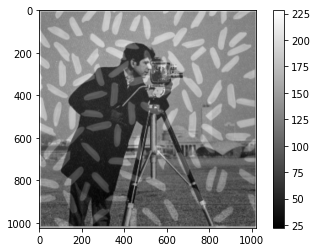

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Load images
A = cv2.imread('/content/drive/MyDrive/vision_artificial/images/Cameraman.png', cv2.IMREAD_GRAYSCALE) # gray scale
B = cv2.imread('/content/drive/MyDrive/vision_artificial/images/Rice.png', cv2.IMREAD_GRAYSCALE) # gray scale

A = A[0:1024,0:1022]
k = 0.5 # Set to combine 2 images
C = (k * A) + ((1 - k) * B)

# Display image
imgplotC = plt.imshow(C, cmap="gray")
plt.colorbar()

# Detección de movimiento

Text(0.5, 1.0, 'Detección de movimiento')

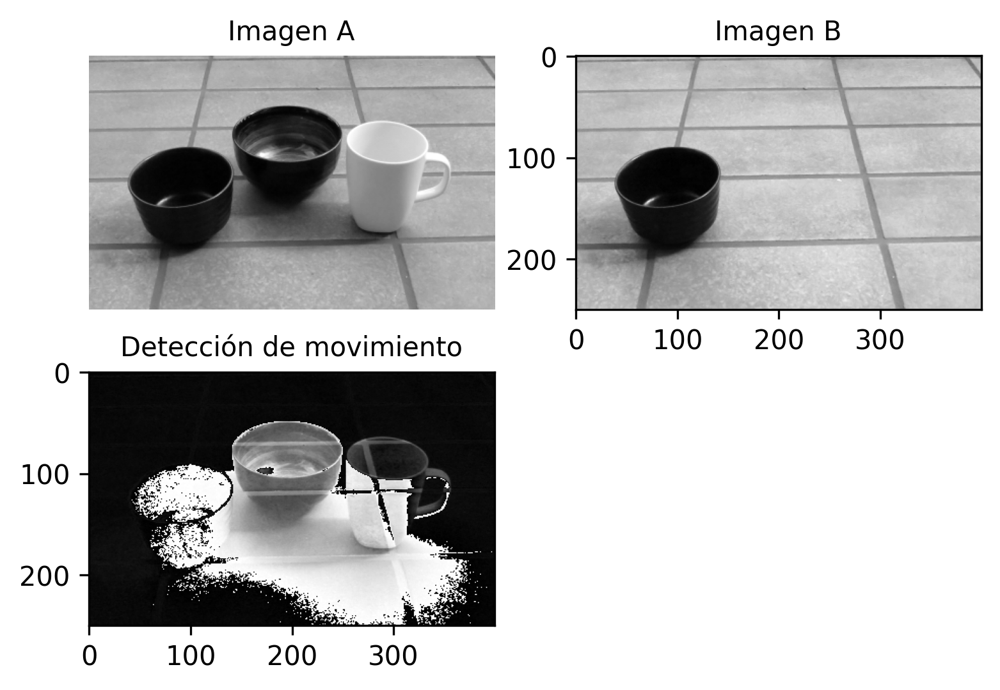

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Load images
im_A = cv2.imread('/content/drive/MyDrive/vision_artificial/images/sub_A.png', cv2.IMREAD_GRAYSCALE) # gray scale
im_B = cv2.imread('/content/drive/MyDrive/vision_artificial/images/sub_B.png', cv2.IMREAD_GRAYSCALE) # gray scale

resta = im_A - im_B 

# Display images
fig=plt.figure(dpi=300)

fig.add_subplot(2,2,1)
plt.imshow(im_A, cmap="gray")
plt.axis("off")
plt.title("Imagen A", fontsize = 10)

fig.add_subplot(2,2,2)
plt.imshow(im_B, cmap="gray")
plt.title("Imagen B", fontsize = 10)

fig.add_subplot(2,2,3)
plt.imshow(resta, cmap="gray")
plt.title("Detección de movimiento", fontsize = 10)

# Detección de movimiento con umbralización y operaciones lógicas (XOR operador)

Text(0.5, 1.0, 'Detección de movimiento')

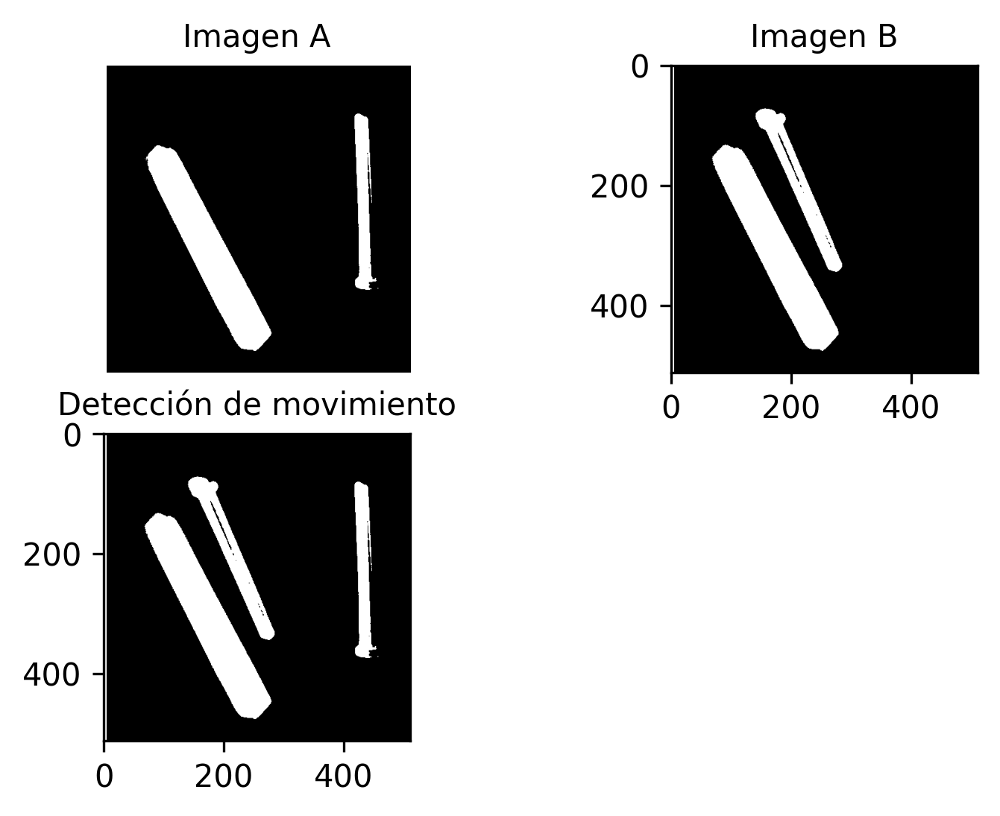

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Load images
im_A = cv2.imread('/content/drive/MyDrive/vision_artificial/images/scr3.png', cv2.IMREAD_GRAYSCALE) # gray scale
im_B = cv2.imread('/content/drive/MyDrive/vision_artificial/images/scr4.png', cv2.IMREAD_GRAYSCALE) # gray scale

k = 0.5 # to combine 2 images
thr = 160 # umbral (0 - 255)

im_A[im_A <= thr] = 1
im_A[im_A > thr] = 0
im_B[im_B <= thr] = 1
im_B[im_B > thr] = 0

# Implements XOR operator
im_C = (k * im_A) + ((1 - k) * im_B)
im_C[im_C <= 0] = 0
im_C[im_C > 0] = 1

# Display image
fig=plt.figure(dpi=300)

fig.add_subplot(2,2,1)
plt.imshow(im_A, cmap="gray")
plt.axis("off")
plt.title("Imagen A", fontsize = 10)

fig.add_subplot(2,2,2)
plt.imshow(im_B, cmap="gray")
plt.title("Imagen B", fontsize = 10)

fig.add_subplot(2,2,3)
plt.imshow(im_C, cmap="gray")
plt.title("Detección de movimiento", fontsize = 10)

# Composición de 2 imágenes, una imagen reducida en una esquina
Una de las imágenes, concretamente una versión reducida, estará en la esquina inferior derecha de la otra imagen

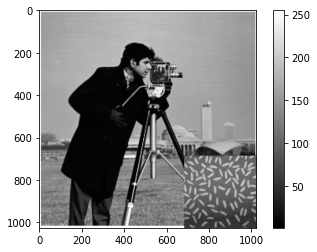

In [ ]:
import cv2
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFilter

# Load images
im1 = Image.open('/content/drive/MyDrive/vision_artificial/images/Cameraman.png')
im2 = Image.open('/content/drive/MyDrive/vision_artificial/images/Rice.png')

basewidth = 342 # set new size in horizontal to image 2
wpercent = (basewidth / float(im2.size[0]))
hsize = int((float(im2.size[1]) * float(wpercent)))
im2 = im2.resize((basewidth, hsize), Image.ANTIALIAS) # scale image

width_im1, height_im1 = im1.size
width_im2, height_im2 = im2.size

# Save image combined
im1.paste(im2, (width_im1 - width_im2, height_im1 - height_im2), im2) # set im2 in corner right down
im1.save('/content/drive/MyDrive/vision_artificial/images/Cameraman_Rice.png', quality=95)

# Load image combined
composition = cv2.imread('/content/drive/MyDrive/vision_artificial/images/Cameraman_Rice.png', cv2.IMREAD_GRAYSCALE) # gray scale
# Display image
imgplotGG = plt.imshow(composition, cmap="gray")
plt.colorbar()

# Brillo con operaciones aritméticas suma y multiplicación (Subir brillo)

Text(0.5, 1.0, 'Imagen con mas brillo')

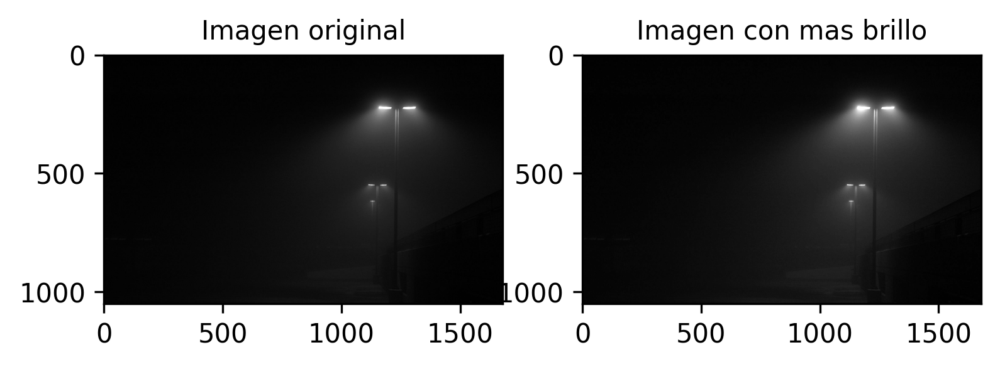

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Load image
imagenEnt = cv2.imread('/content/drive/MyDrive/vision_artificial/images/D1.jpg', cv2.IMREAD_GRAYSCALE) # gray scale

scalar = 64 # Set brightness level
lowBrightnessIm = cv2.add(imagenEnt, scalar)
minimo = lowBrightnessIm.min()

# Display images
fig=plt.figure(dpi=300)

fig.add_subplot(1,2,1)
plt.imshow(imagenEnt, cmap="gray")
plt.title("Imagen original", fontsize = 10)

fig.add_subplot(1,2,2)                         
plt.imshow(lowBrightnessIm, cmap="gray")
plt.title("Imagen con mas brillo", fontsize = 10)

# Brillo con operaciones aritméticas resta y división (Bajar brillo)

Text(0.5, 1.0, 'Imagen con brillo')

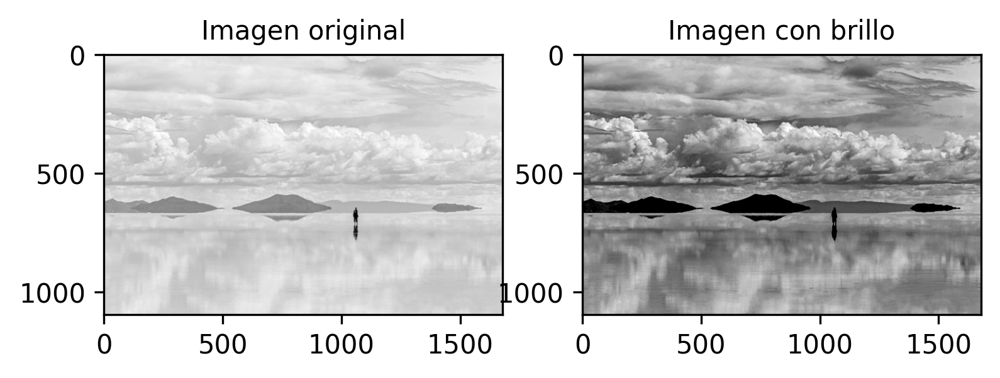

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Load image
imagenEnt = cv2.imread('/content/drive/MyDrive/vision_artificial/images/Brighten.jpg', cv2.IMREAD_GRAYSCALE) # gray scale

scalar = 150 # Set brightness level
highBrightnessIm = cv2.subtract(imagenEnt, scalar)

# Display images
fig=plt.figure(dpi=300)

fig.add_subplot(1,2,1)
plt.imshow(imagenEnt, cmap="gray")
plt.title("Imagen original", fontsize = 10)

fig.add_subplot(1,2,2)                         
plt.imshow(highBrightnessIm, cmap="gray")
plt.title("Imagen con menos brillo", fontsize = 10)

# Inverso de una imagen (Imágen en negativo)

Text(0.5, 1.0, 'Imagen inverso')

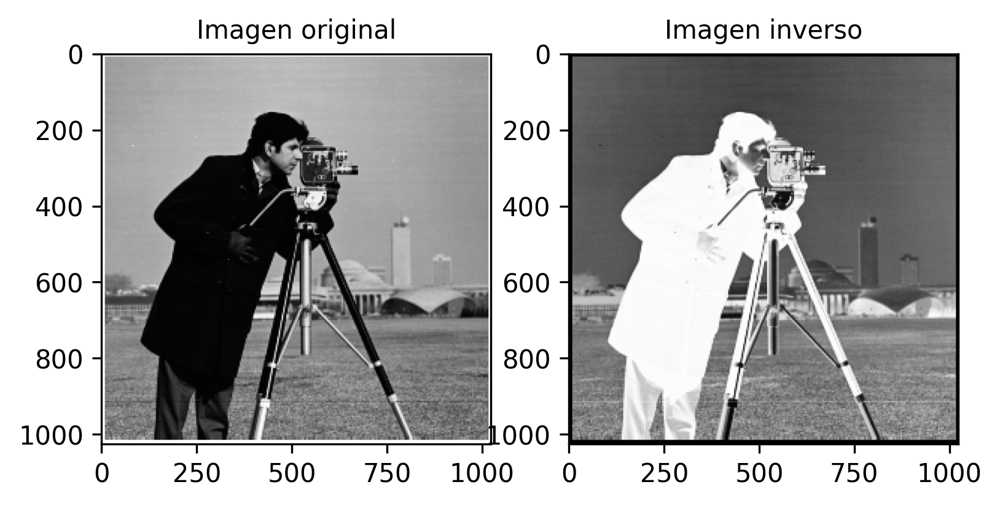

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
A = cv2.imread('/content/drive/MyDrive/vision_artificial/images/Cameraman.png', cv2.IMREAD_GRAYSCALE) # gray scale

invA = np.invert(np.copy(A))

# Display images
fig=plt.figure(dpi=300)

fig.add_subplot(1,2,1)
plt.imshow(A, cmap="gray")
plt.title("Imagen original", fontsize = 10)

fig.add_subplot(1,2,2)                         
plt.imshow(invA, cmap="gray")
plt.title("Imagen inverso", fontsize = 10)

# Operador umbral para imágenes en escala de grises (Imágen en blanco y negro)

Text(0.5, 1.0, 'Imagen en blanco y negro')

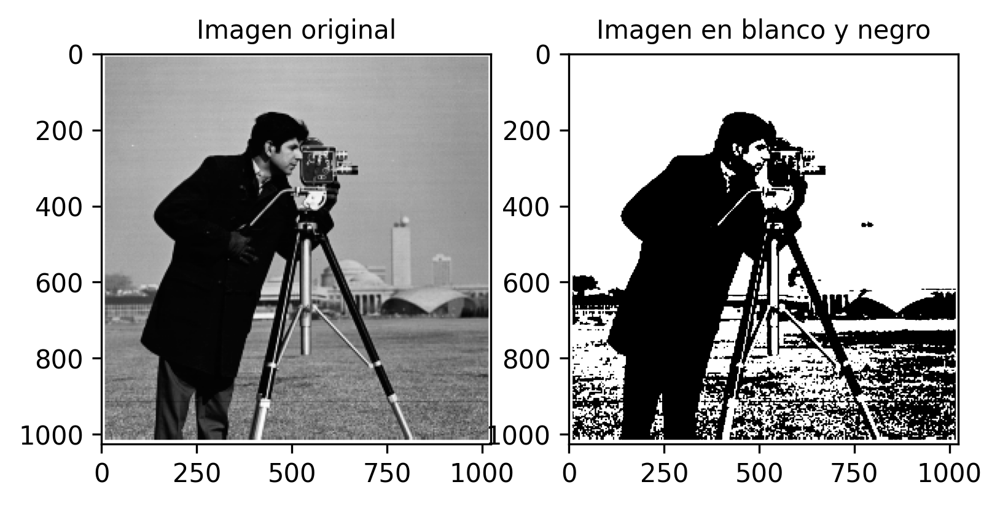

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
A = cv2.imread('/content/drive/MyDrive/vision_artificial/images/Cameraman.png', cv2.IMREAD_GRAYSCALE) # gray scale

thrIm = np.copy(A)
thr = 127
thrIm[A <= thr] = 0
thrIm[A > thr] = 1

# Display images
fig=plt.figure(dpi=300)

fig.add_subplot(1,2,1)
plt.imshow(A, cmap="gray")
plt.title("Imagen original", fontsize = 10)

fig.add_subplot(1,2,2)                         
plt.imshow(thrIm, cmap="gray")
plt.title("Imagen en blanco y negro", fontsize = 10)

# Cambiar tamaño (escalamiento) de una imagen (Subir tamaño)

Text(0.5, 1.0, 'Imagen con tamaño mayor')

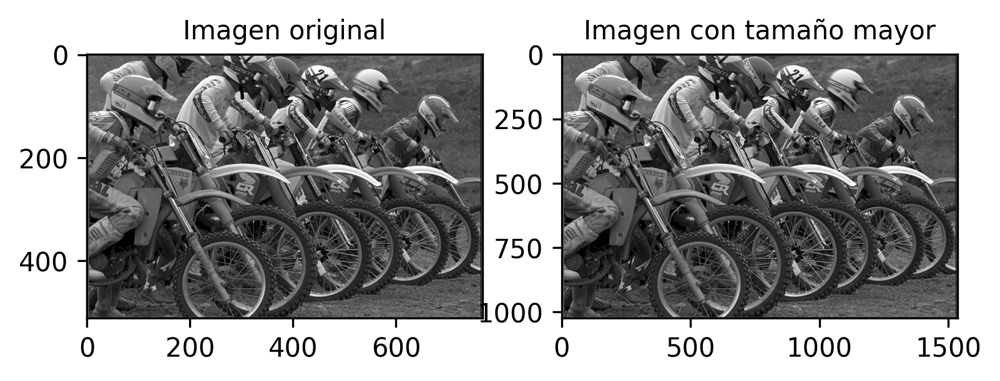

In [41]:
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Load image
inputIm = cv2.imread('/content/drive/MyDrive/vision_artificial/images/kodim05.png',cv2.IMREAD_GRAYSCALE) # gray scale

height, width = inputIm.shape[:2]
kScalar = 2 # Duplicate X2 image size
resizedIm = cv2.resize(inputIm,(kScalar*width, kScalar*height), interpolation = cv2.INTER_CUBIC)

# Display images
fig=plt.figure(dpi=300)

fig.add_subplot(1,2,1)
plt.imshow(inputIm, cmap="gray", vmin=0, vmax=255, interpolation='bilinear', aspect='equal')
plt.title("Imagen original", fontsize = 10)

fig.add_subplot(1,2,2)                         
plt.imshow(resizedIm, cmap="gray", vmin=0, vmax=255, interpolation='bilinear', aspect='equal')
plt.title("Imagen con tamaño mayor", fontsize = 10)

# Cambiar tamaño (escalamiento) de una imagen (Bajar tamaño)

Text(0.5, 1.0, 'Imagen con tamaño menor')

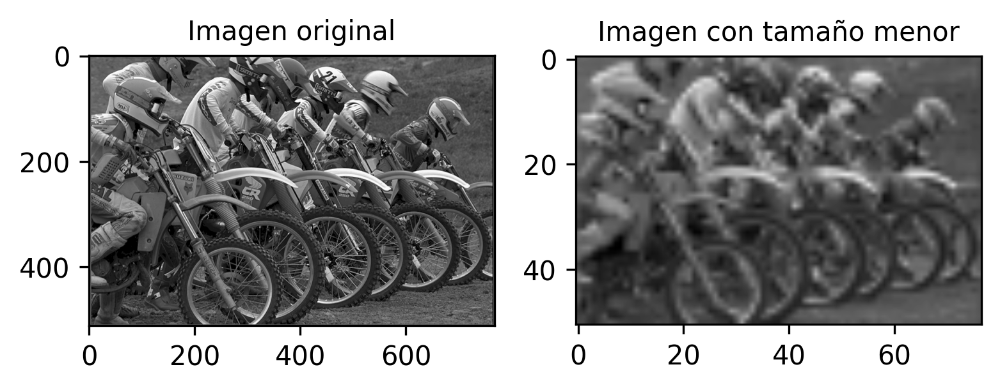

In [ ]:
import cv2
import math
import numpy as np
import matplotlib.pyplot as plt

# Load image
inputIm = cv2.imread('/content/drive/MyDrive/vision_artificial/images/kodim05.png',cv2.IMREAD_GRAYSCALE) # gray scale

height, width = inputIm.shape[:2]
kScalar = 0.1 # Set to reduce image
newRowSize = math.trunc(np.around(kScalar*width))
newColSize = int(np.around(kScalar*height))
resizedIm = cv2.resize(inputIm,(newRowSize, newColSize), interpolation = cv2.INTER_AREA)

# Display images
fig=plt.figure(dpi=300)

fig.add_subplot(1,2,1)
plt.imshow(inputIm, cmap="gray", vmin=0, vmax=255, interpolation='bilinear', aspect='equal')
plt.title("Imagen original", fontsize = 10)

fig.add_subplot(1,2,2)                         
plt.imshow(resizedIm, cmap="gray", vmin=0, vmax=255, interpolation='bilinear', aspect='equal')
plt.title("Imagen con tamaño menor", fontsize = 10)

# Recorte de imagen

Text(0.5, 1.0, 'Recorte')

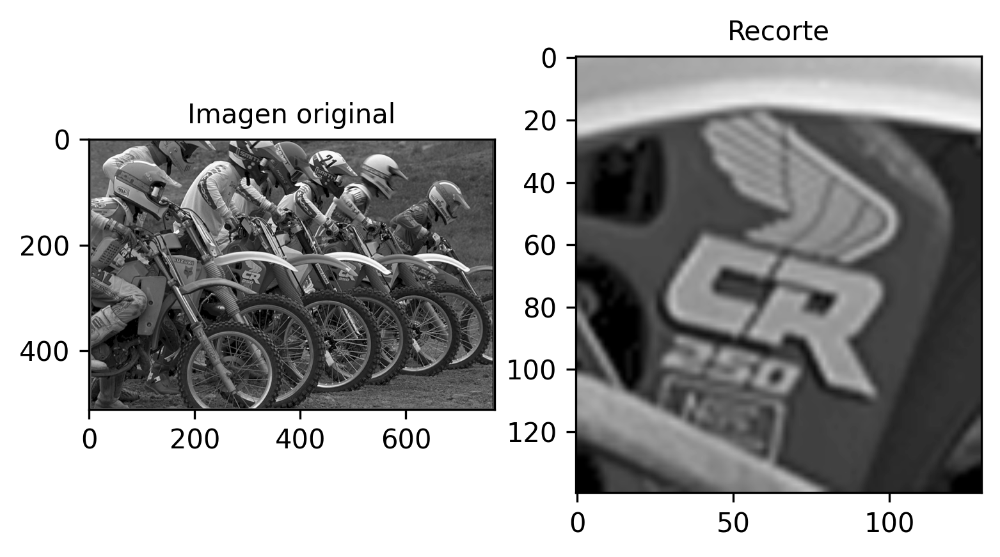

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Load image
inputIm = cv2.imread('/content/drive/MyDrive/vision_artificial/images/kodim05.png',cv2.IMREAD_GRAYSCALE) # gray scale

width = 275 # Set position initial in horizontal
height = 220 # Set position initial in vertical
x = 65 # Set pixels to length in horizontal
y = 70 # Set pixels to length in vertical

crop_img = inputIm[height:height + y, width:width + x]

# Up resolution
height, width = crop_img.shape[:2]
kScalar = 2 # Set size to up resolution to image
resizedIm = cv2.resize(crop_img,(kScalar * width, kScalar * height), interpolation = cv2.INTER_CUBIC)

# Display images
fig=plt.figure(dpi=300)

fig.add_subplot(1,2,1)
plt.imshow(inputIm, cmap="gray", vmin=0, vmax=255, interpolation='bilinear', aspect='equal')
plt.title("Imagen original", fontsize = 10)

fig.add_subplot(1,2,2)                         
plt.imshow(resizedIm, cmap="gray", vmin=0, vmax=255, interpolation='bilinear', aspect='equal')
plt.title("Recorte", fontsize = 10)

# Desplazamiento geométrico de las coordendas de los píxeles en una imagen

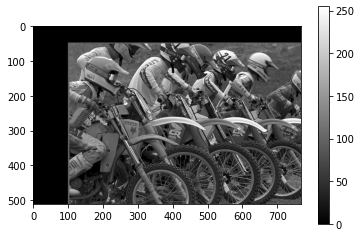

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
inputIm = cv2.imread('/content/drive/MyDrive/vision_artificial/images/kodim05.png',cv2.IMREAD_GRAYSCALE) # gray scale

rows,cols = inputIm.shape
Tx = 100
Ty = 50
M = np.float32([[1,0,Tx],[0,1,Ty]])
xyShiftedIm = cv2.warpAffine(inputIm,M,(cols,rows))

# Display image
plotresizeIm = plt.imshow(xyShiftedIm, cmap="gray")
plt.colorbar()

# Rotación de una imagen

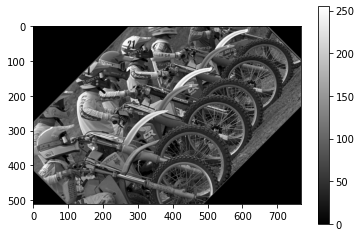

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Load image
inputIm = cv2.imread('/content/drive/MyDrive/vision_artificial/images/kodim05.png',cv2.IMREAD_GRAYSCALE) # gray scale

nFilas,nCols = inputIm.shape
M = cv2.getRotationMatrix2D(((nCols - 1) / 2.0, (nFilas - 1) / 2.0), 45, 1.0)
rotatedIm = cv2.warpAffine(inputIm,M,(nCols,nFilas))

# Display image
plotresizeIm = plt.imshow(rotatedIm, cmap="gray")
plt.colorbar()